<a href="https://colab.research.google.com/github/robinrb7/ObjectDetection_Segmentation/blob/main/ObjectDetection_Segementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Wed Feb 26 13:50:48 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   33C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 463, done.
remote: Counting objects: 100% (240/240), done.
remote: Compressing objects: 100% (104/104), done.
remote: Total 463 (delta 175), reused 136 (delta 136), pack-reused 223 (from 1)
Receiving objects: 100% (463/463), 12.87 MiB | 8.20 MiB/s, done.
Resolving deltas: 100% (241/241), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━

In [ ]:
!pip install 'git+https://github.com/facebookresearch/segment-anything.git'

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-72u8ofio
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-72u8ofio
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=931ee91df549bbfb8e9d8660f9e7ce19c0466bc9038a4f141793ad9a852438bb
  Stored in directory: /tmp/pip-ephem-wheel-cache-i11p3390/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything


In [ ]:
!pip install torch

In [ ]:
!pip install torchvision

In [ ]:
!pip install supervision==0.12.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 MB 14.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 3.3 MB/s eta 0:00:00
  Created wheel for pillow: filename=Pillow-8.4.0-cp311-cp311-linux_x86_64.whl size=1171663 sha256=6d099b121e752503f0a95c45da779538a3352f65c4bc16a5f57aa5a63e16a0b9
  Stored in directory: /root/.cache/pip/wheels/c7/cf/6a/49767496ca114325703308efc0519f97126e3ca06dd91845b7
Successfully built pillow
  Attempting uninstall: pillow
    Found existing installation: pillow 11.1.0
    Uninstalling pillow-11.1.0:
      Successfully uninstalled pillow-11.1.0
  Attempting uninstall: supervision
    Found existing installation: supervision 0.25.1
    Uninstalling supervision-0.25.1:
      Successfully uninstalled supervision-0.25.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts

In [ ]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [ ]:
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

In [ ]:
%cd {HOME}
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(DEVICE)

/content
cuda:0


In [ ]:
GROUNDING_DINO_CONFIG_PATH = '/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py'
GROUNDING_DINO_CHECKPOINT_PATH = '/content/weights/groundingdino_swint_ogc.pth'

In [ ]:
from groundingdino.util.inference import Model
GD_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

/content/GroundingDINO/groundingdino/util/inference.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_checkpoint_path, map_location="cpu")


In [ ]:
import cv2
image_bgr = cv2.imread('/content/durian.jpg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
image_original = image_bgr

print(image_bgr.shape)

image_bgr = cv2.resize(image_bgr, (1024, 1024))
image_rgb = cv2.resize(image_rgb, (1024, 1024))
image_original = cv2.resize(image_original, (1024, 1024))

print(image_bgr.shape)

(1198, 1599, 3)
(1024, 1024, 3)


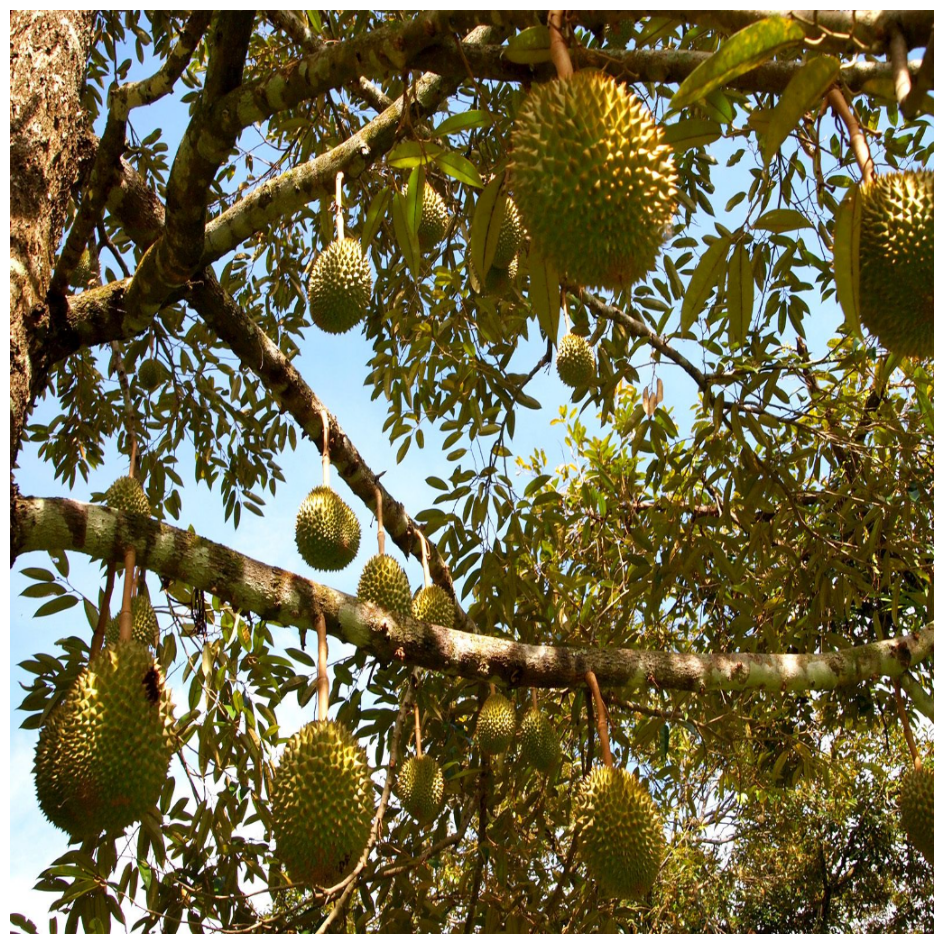

In [ ]:
import supervision as sv
sv.plot_image(image_bgr)

In [ ]:
# detect objects
CLASSES = ['durian']
detections = GD_model.predict_with_classes(
    image=image_rgb,
    classes=CLASSES,
    box_threshold=0.35,
    text_threshold=0.25
)

print(detections)

Detections(xyxy=array([[286.90613 , 785.09094 , 403.1786  , 974.2543  ],
       [327.8508  , 251.69322 , 402.23618 , 359.6237  ],
       [549.5753  ,  63.568092, 742.6035  , 309.17877 ],
       [621.602   , 836.83716 , 726.6202  , 986.9165  ],
       [425.01163 , 825.22485 , 482.2996  , 904.11865 ],
       [ 22.285942, 696.8376  , 186.06677 , 923.4948  ],
       [314.66385 , 526.0298  , 389.16995 , 622.8203  ],
       [514.1371  , 754.4972  , 561.78    , 825.55273 ],
       [383.81845 , 602.3057  , 446.20023 , 682.89996 ],
       [604.6375  , 358.73822 , 648.9659  , 417.98883 ],
       [564.99963 , 772.9779  , 609.5386  , 844.84753 ],
       [431.10587 , 184.72543 , 492.03323 , 265.78036 ],
       [444.9042  , 635.65955 , 496.48294 , 686.8738  ]], dtype=float32), mask=None, confidence=array([0.57953495, 0.5221523 , 0.47429323, 0.5467406 , 0.5050529 ,
       0.47699893, 0.5407628 , 0.48627898, 0.47129732, 0.43905282,
       0.46031705, 0.4622937 , 0.41262782], dtype=float32), class_id=a

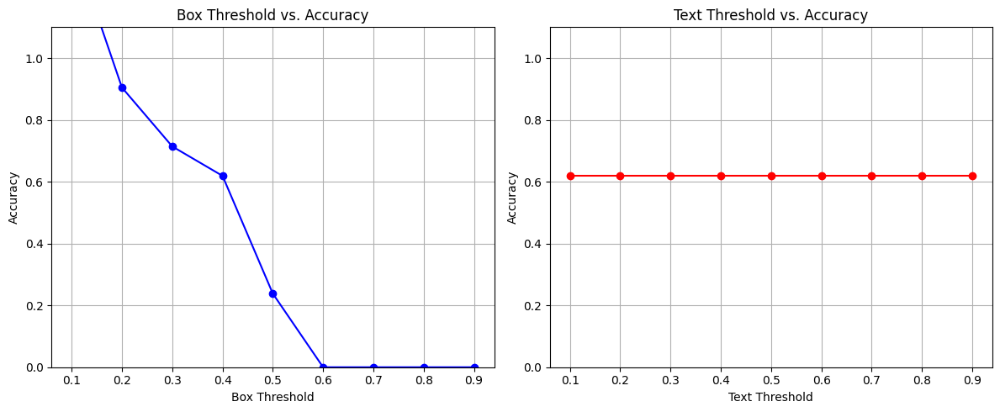

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Hardcoded total number of durians in the image
total_durians = 21  # Replace this with the actual number of durians in your image

# Define a range of thresholds
box_thresholds = np.linspace(0.1, 0.9, 9)  # From 0.1 to 0.9 in 9 steps
text_thresholds = np.linspace(0.1, 0.9, 9)  # From 0.1 to 0.9 in 9 steps

# Fixed values for comparison
fixed_text_threshold = 0.25
fixed_box_threshold = 0.35

# Function to calculate accuracy
def calculate_accuracy(image, classes, box_threshold, text_threshold, total_durians):
    detections = GD_model.predict_with_classes(
        image=image,
        classes=classes,
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )
    detected_durians = len(detections.xyxy)
    accuracy = detected_durians / total_durians
    return accuracy

# Evaluate for box_threshold (with fixed text_threshold)
box_accuracies = []
for box_threshold in box_thresholds:
    accuracy = calculate_accuracy(image_rgb, CLASSES, box_threshold, fixed_text_threshold, total_durians)
    box_accuracies.append(accuracy)

# Evaluate for text_threshold (with fixed box_threshold)
text_accuracies = []
for text_threshold in text_thresholds:
    accuracy = calculate_accuracy(image_rgb, CLASSES, fixed_box_threshold, text_threshold, total_durians)
    text_accuracies.append(accuracy)

# Plot the results
plt.figure(figsize=(12, 5))

# Plot 1: Box Threshold vs. Accuracy
plt.subplot(1, 2, 1)
plt.plot(box_thresholds, box_accuracies, marker='o', linestyle='-', color='b')
plt.title('Box Threshold vs. Accuracy')
plt.xlabel('Box Threshold')
plt.ylabel('Accuracy')
plt.ylim(0, 1.1)  # Set y-axis limit to better visualize accuracy
plt.grid(True)

# Plot 2: Text Threshold vs. Accuracy
plt.subplot(1, 2, 2)
plt.plot(text_thresholds, text_accuracies, marker='o', linestyle='-', color='r')
plt.title('Text Threshold vs. Accuracy')
plt.xlabel('Text Threshold')
plt.ylabel('Accuracy')
plt.ylim(0, 1.1)  # Set y-axis limit to better visualize accuracy
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
print(detections.xyxy, type(detections.xyxy))
detected_boxes = detections.xyxy
class_id = detections.class_id
print(class_id)

[[286.90613  785.09094  403.1786   974.2543  ]
 [327.8508   251.69322  402.23618  359.6237  ]
 [549.5753    63.568092 742.6035   309.17877 ]
 [621.602    836.83716  726.6202   986.9165  ]
 [425.01163  825.22485  482.2996   904.11865 ]
 [ 22.285942 696.8376   186.06677  923.4948  ]
 [314.66385  526.0298   389.16995  622.8203  ]
 [514.1371   754.4972   561.78     825.55273 ]
 [383.81845  602.3057   446.20023  682.89996 ]
 [604.6375   358.73822  648.9659   417.98883 ]
 [564.99963  772.9779   609.5386   844.84753 ]
 [431.10587  184.72543  492.03323  265.78036 ]
 [444.9042   635.65955  496.48294  686.8738  ]] <class 'numpy.ndarray'>
[0 0 0 0 0 0 0 0 0 0 0 0 0]


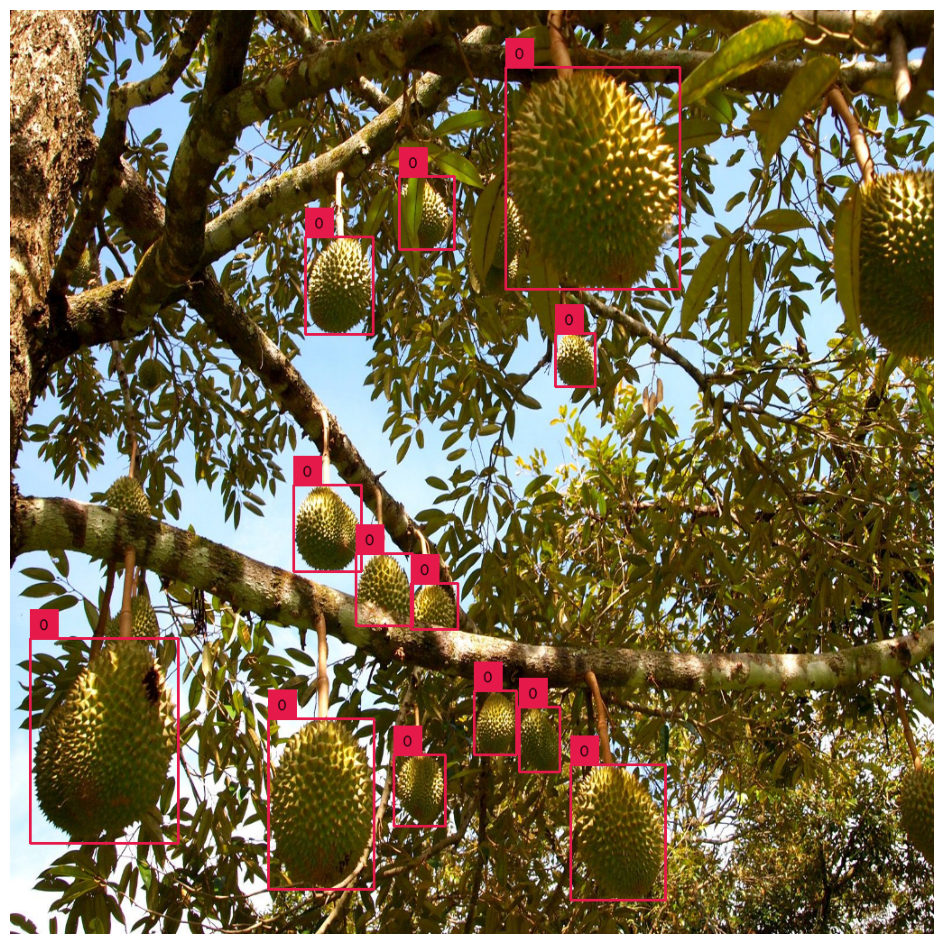

In [ ]:
import supervision as sv
box_annotator = sv.BoxAnnotator()
annotated_frame = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=False, labels=[class_id])
sv.plot_image(annotated_frame)

In [ ]:
MODEL_TYPE = "vit_h"
CHECKPOINT_PATH = '/content/weights/sam_vit_h_4b8939.pth'

from segment_anything import sam_model_registry, SamPredictor

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

mask_predictor = SamPredictor(sam)

In [ ]:
import numpy as np
mask_annotator =  sv.MaskAnnotator(color=sv.Color.blue())
segmented_mask = []
counter = 0
for mybox in detected_boxes:
    mybox = np.array(mybox)
    print(mybox)


    mask_predictor.set_image(image_rgb)
    masks, scores, logits = mask_predictor.predict(
        point_coords=None,
        point_labels=None,
        box=mybox,
        multimask_output=False
    )

    segmented_mask.append(masks)
    print(len(masks), masks.shape)

# plot mask on image using supervision
    detections = sv.Detections(
        xyxy=sv.mask_to_xyxy(masks=masks),
        mask=masks
    )

    detections = detections[detections.area == np.max(detections.area)]
    print(CLASSES[class_id[counter]])

    annotated_image = box_annotator.annotate(scene=image_original.copy(), detections=detections, skip_label=False, labels=[CLASSES[class_id[counter]]])
    annotated_image = mask_annotator.annotate(scene=annotated_image.copy(), detections=detections)
    image_original = annotated_image

    counter+=1

[286.90613 785.09094 403.1786  974.2543 ]
1 (1, 1024, 1024)
durian
[327.8508  251.69322 402.23618 359.6237 ]
1 (1, 1024, 1024)
durian
[549.5753    63.568092 742.6035   309.17877 ]
1 (1, 1024, 1024)
durian
[621.602   836.83716 726.6202  986.9165 ]
1 (1, 1024, 1024)
durian
[425.01163 825.22485 482.2996  904.11865]
1 (1, 1024, 1024)
durian
[ 22.285942 696.8376   186.06677  923.4948  ]
1 (1, 1024, 1024)
durian
[314.66385 526.0298  389.16995 622.8203 ]
1 (1, 1024, 1024)
durian
[514.1371  754.4972  561.78    825.55273]
1 (1, 1024, 1024)
durian
[383.81845 602.3057  446.20023 682.89996]
1 (1, 1024, 1024)
durian
[604.6375  358.73822 648.9659  417.98883]
1 (1, 1024, 1024)
durian
[564.99963 772.9779  609.5386  844.84753]
1 (1, 1024, 1024)
durian
[431.10587 184.72543 492.03323 265.78036]
1 (1, 1024, 1024)
durian
[444.9042  635.65955 496.48294 686.8738 ]
1 (1, 1024, 1024)
durian


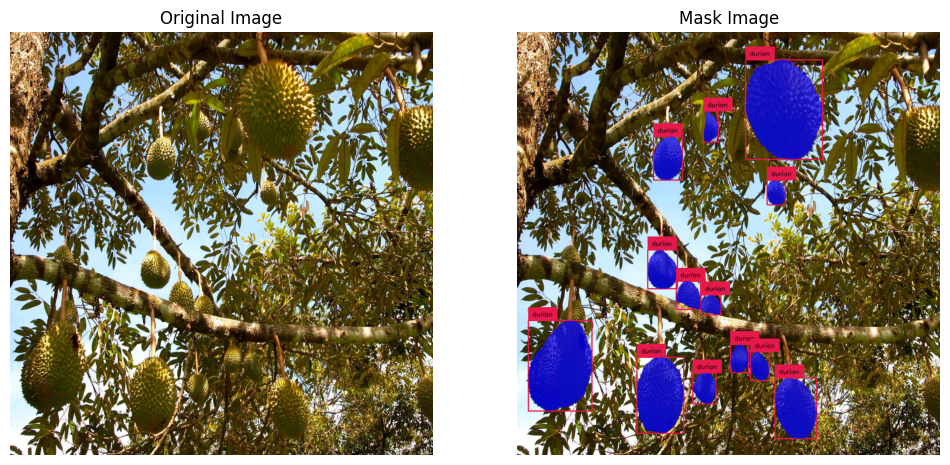

In [ ]:
sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1,2),
    titles=['Original Image', 'Mask Image']

)

In [ ]:
print(len(segmented_mask), type(segmented_mask[0]), segmented_mask[0].shape)

for i in range(len(segmented_mask)):

  segmented_mask[i] = segmented_mask[i].transpose(1,2,0)
  segmented_mask[i] = np.array(segmented_mask[i]*255).astype('uint8')
  segmented_mask[i]  = cv2.cvtColor(segmented_mask[i] , cv2.COLOR_GRAY2BGR)


print(segmented_mask[0].shape)

13 <class 'numpy.ndarray'> (1, 1024, 1024)
(1024, 1024, 3)


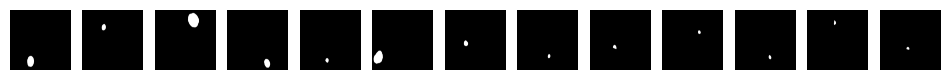

In [ ]:
sv.plot_images_grid(
    images=segmented_mask,
    grid_size=(1, len(segmented_mask)),

)

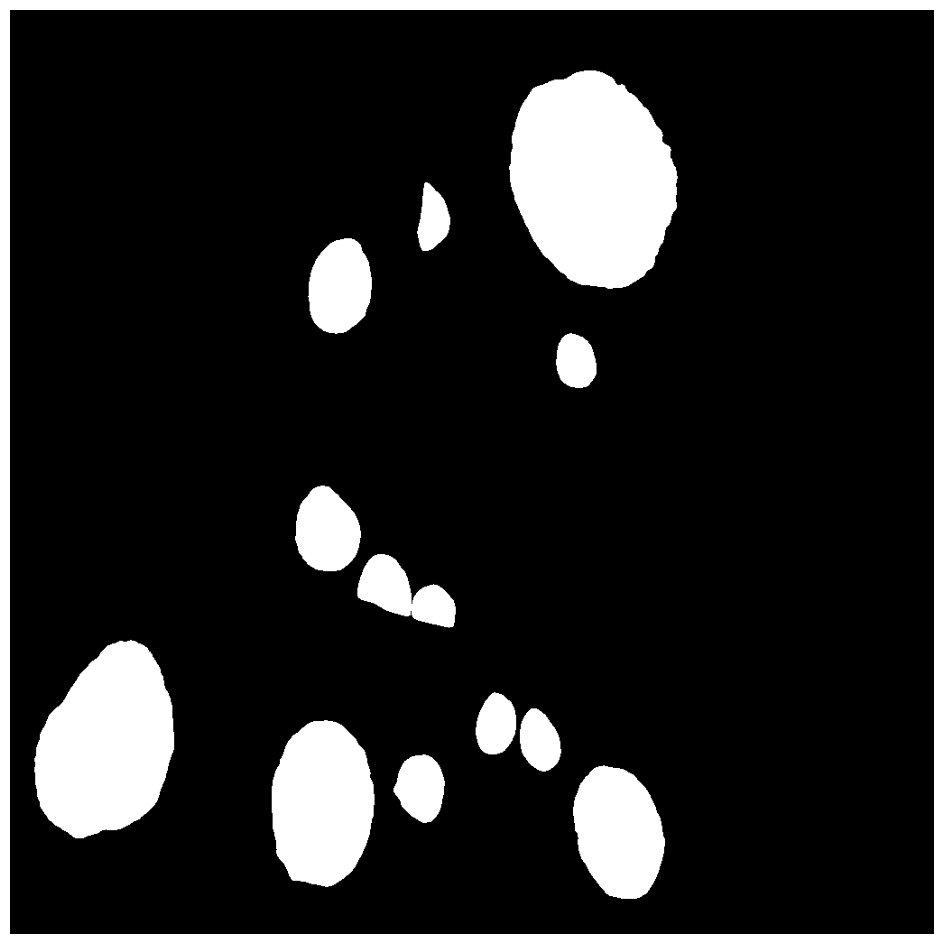

In [ ]:
segmented_image = segmented_mask[0]

for i in range(len(segmented_mask)):
  try:
    segmented_image = cv2.bitwise_or(segmented_image, segmented_mask[i+1])
  except:
    pass

sv.plot_image(segmented_image)

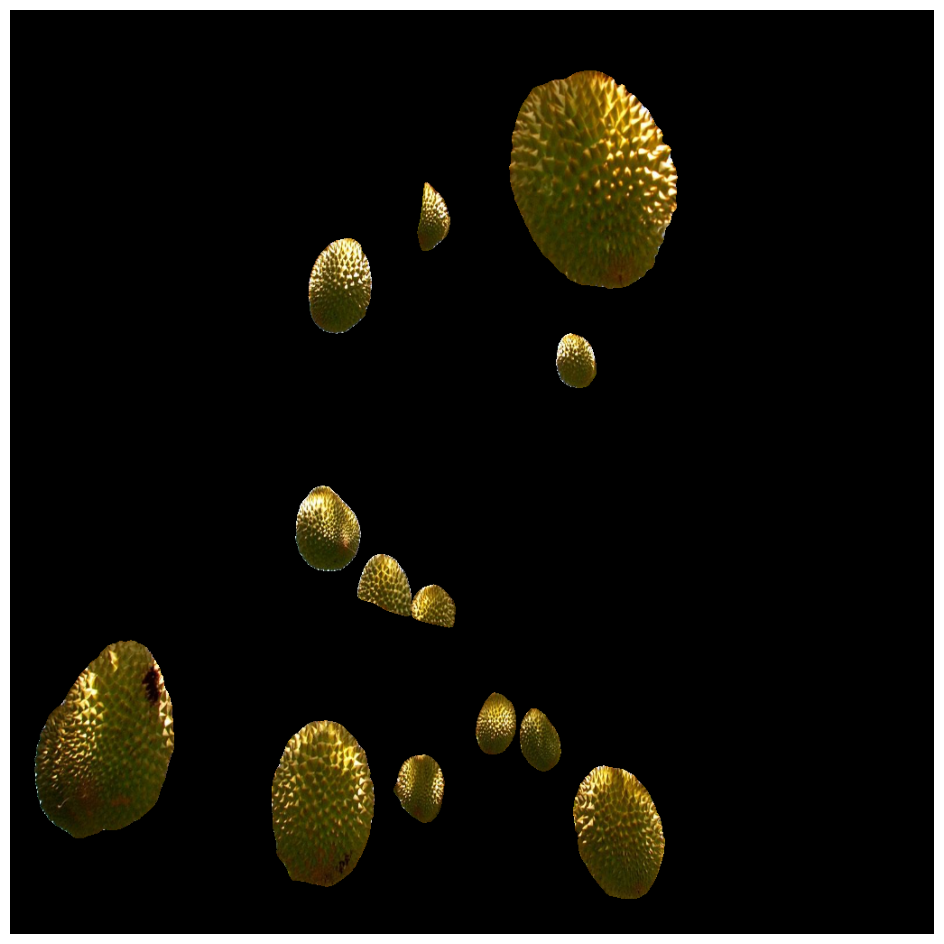

In [ ]:
segmented_image = cv2.bitwise_and(segmented_image, image_bgr)
sv.plot_image(segmented_image)

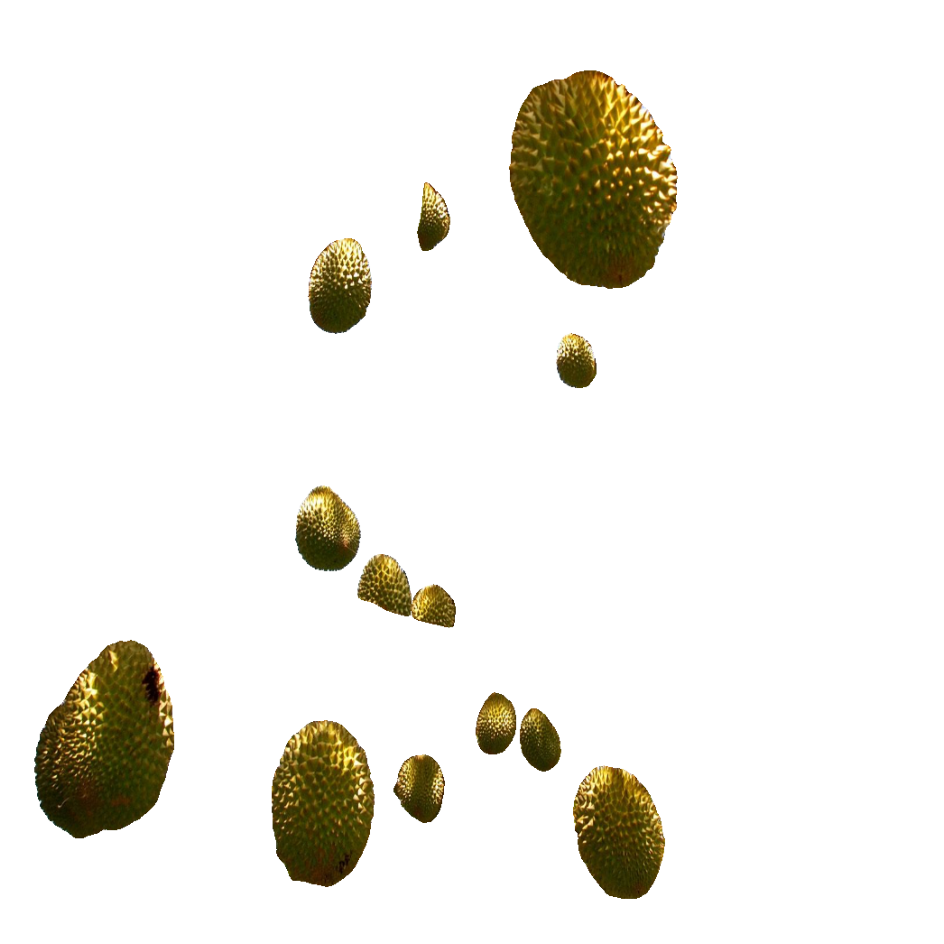

In [ ]:
segmented_image[np.where((segmented_image == [0, 0, 0]).all(axis=2))] = [255, 255, 255]
sv.plot_image(segmented_image)

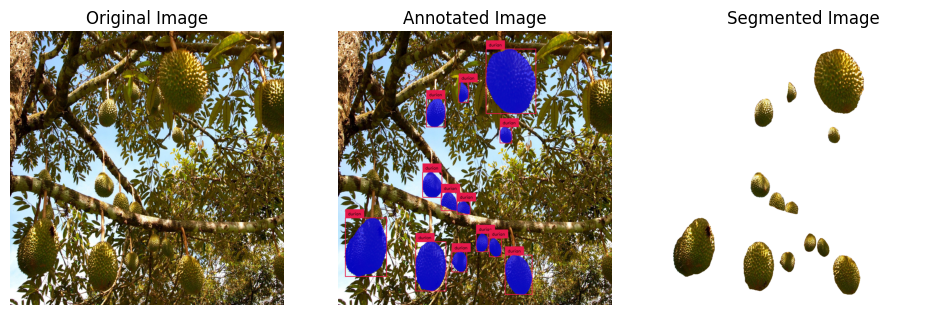

In [ ]:
sv.plot_images_grid(
    images=[image_bgr, annotated_image, segmented_image],
    grid_size=(1, 3),
    titles=['Original Image', 'Annotated Image', 'Segmented Image'],
    #size=(48,48)

)

Durian 1: Size = 127.25 cm²
Durian 2: Size = 44.84 cm²
Durian 3: Size = 261.20 cm²
Durian 4: Size = 86.77 cm²
Durian 5: Size = 24.14 cm²
Durian 6: Size = 189.69 cm²
Durian 7: Size = 40.03 cm²
Durian 8: Size = 18.14 cm²
Durian 9: Size = 22.54 cm²
Durian 10: Size = 16.47 cm²
Durian 11: Size = 18.02 cm²
Durian 12: Size = 14.46 cm²
Durian 13: Size = 13.62 cm²


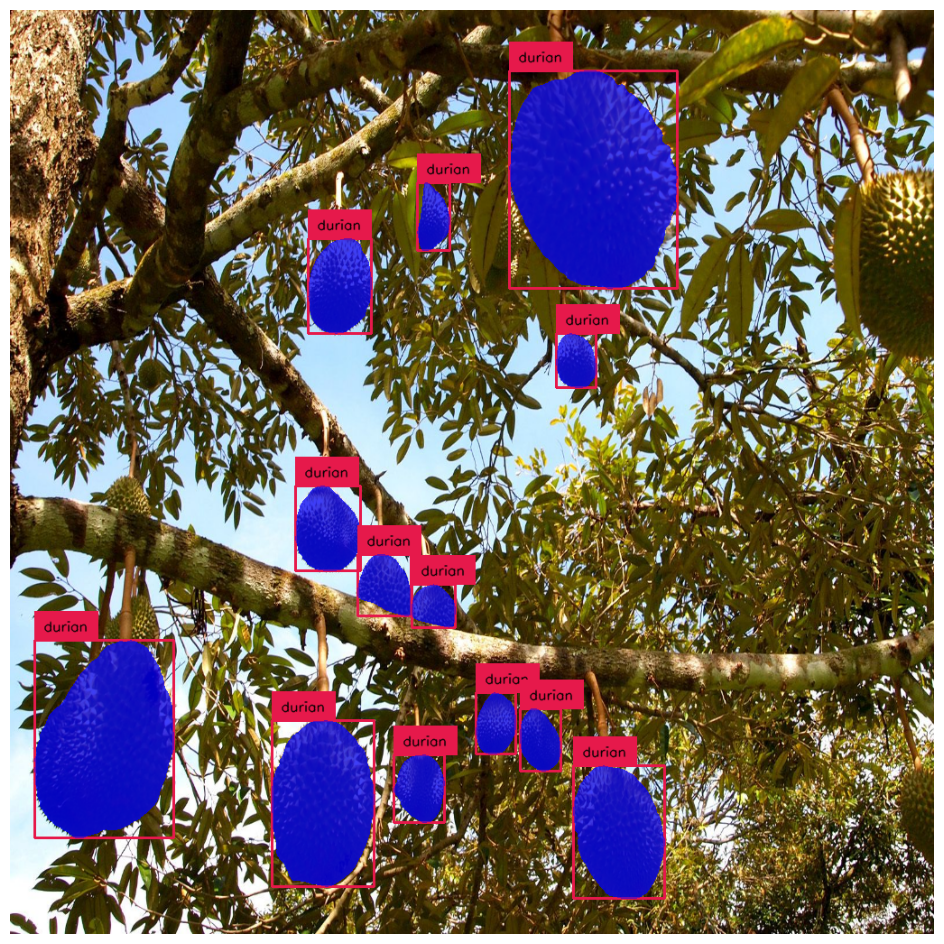

In [ ]:


# Step 1: Calculate the area of each mask in pixels
mask_areas_pixels = [np.sum(mask) for mask in segmented_mask]

# Step 2: Define a scale factor (pixels to real-world units)
# Example: If 100 pixels in the image correspond to 10 cm in real life, the scale factor is:
# scale_factor = (10 cm / 100 pixels)^2 = 0.01 cm²/pixel²
# Replace this with your actual scale factor
scale_factor = 0.00001  # Example: 0.01 cm²/pixel²

# Step 3: Convert pixel area to real-world size
mask_areas_real_world = [area * scale_factor for area in mask_areas_pixels]

# Step 4: Output the sizes
for i, area in enumerate(mask_areas_real_world):
    print(f"Durian {i+1}: Size = {area:.2f} cm²")

# Optional: Visualize the sizes on the image
annotated_image = image_original.copy()
for i, mask in enumerate(segmented_mask):
    # Check if the mask is empty
    if np.sum(mask) == 0:
        print(f"Warning: Mask {i+1} is empty. Skipping.")
        continue

    # Find the centroid of the mask to place the text
    y, x = np.where(mask[0] > 0)  # Get the coordinates of the mask
    if len(x) == 0 or len(y) == 0:
        continue

    centroid_x = int(np.mean(x))
    centroid_y = int(np.mean(y))

    # Draw the size on the image
    cv2.putText(annotated_image, f"{mask_areas_real_world[i]:.2f} cm²", (centroid_x, centroid_y),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# Display the annotated image
sv.plot_image(annotated_image)

In [14]:
!apt-get update
!apt-get install -y texlive-xetex texlive-fonts-recommended texlive-plain-generic
!pip install nbconvert

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:8 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,639 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [3,664 kB]
Get:11 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,235 kB]
Hit:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:13 https://ppa.launchpadcontent.ne

In [16]:
!jupyter nbconvert --to pdf ObjectDetection_Segementation.ipynb

[NbConvertApp] Converting notebook ObjectDetection_Segementation.ipynb to pdf
/usr/local/share/jupyter/nbconvert/templates/latex/display_priority.j2:32: UserWarning: Your element with mimetype(s) dict_keys(['application/vnd.colab-display-data+json']) is not able to be represented.
  ((*- endblock -*))
[NbConvertApp] Support files will be in ObjectDetection_Segementation_files/
[NbConvertApp] Making directory ./ObjectDetection_Segementation_files
[NbConvertApp] Writing 74667 bytes to notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', 'notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', 'notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 6817697 bytes to ObjectDetection_Segementation.pdf
